<div style="background-color:#2E87A4 ;color:#FDFDFD;padding:20px;border:1px solid #3184BB;text-align:center;">
<p><font size="6" color="#FDFDFD" face="Lora"><i>Image_Captioning(A Combination of CNN and NLP )</i></font> </p>
</div>

## <div style="padding: 20px;color:white;margin:10;font-size:111%;text-align:left;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://images.pexels.com/photos/579216/pexels-photo-579216.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1)"><b><span style='color:black'>What is the purpose behind doing this project?</span></b> </div>

> We all know that we are living in a world where eveything has become digital content, especially the data has become more and more unstructed such as Image, Text, Audio, Video. 

> Keeping this in mind There are a few reasons for me to attempt this project which i have listed below.

* **To make visullay imapaired individual life easy by making him understand the content of images.**
* **Imporve user experiance which involves image content like social media, commerce websites.**
* **Want to make this project benificial for organizations by automat retrival of large image data.**

### Project's Agenda:
* We need to Build an A.I Model that accurately predicts the appropriate `Caption` to the Given `Image`

## Data Dictionary

**Image Data**
* We are having a total of 8091 images of different categories.

**Text Data**
* In the captions data for a single we have 5 captions which make 40455 captions in total.

## Real world objectives

* The cost of a mis-classification can be very high.
* No strict latency concerns.
* Interpretability is partially important but accuracy should be maintained as much as possible

In [2]:
## Import libraries

# Analysis and manipulation
import numpy as np
import pandas as pd
import re

# VIZ
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use('bmh')
#! pip install wordcloud
from wordcloud import WordCloud

# CNN
import cv2

# Text preprocessing
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
              
## Model saving
import pickle
from pickle import dump
from pickle import load

# Other libraries
import warnings
warnings.filterwarnings('ignore')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

# for HD visualizations
%config InlineBackend.figure_format='retina'



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\RAGUWING\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\RAGUWING\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\RAGUWING\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


## Data

### Source:
Link: https://www.kaggle.com/datasets/adityajn105/flickr8k

In [3]:
# Captions DataFrame
captions = pd.read_csv(r"C:\Users\RAGUWING\Pictures\Image_captioning\captions.txt")
captions.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


### Let's perform EDA on the captions 

In [4]:
captions.shape

(40455, 2)

In [5]:
print('Total Unique Images: ',captions['image'].nunique())
captions['image'].value_counts()

Total Unique Images:  8091


1000268201_693b08cb0e.jpg    5
3388094307_5a83be64a5.jpg    5
3393394134_0caac47e1c.jpg    5
3393343330_b13df4d8ec.jpg    5
3393152604_27bd1037f2.jpg    5
                            ..
2699733386_c346c87ea6.jpg    5
2699426519_228719b1db.jpg    5
2699342860_5288e203ea.jpg    5
2699125097_c6801d80ed.jpg    5
997722733_0cb5439472.jpg     5
Name: image, Length: 8091, dtype: int64

> You can see we have a total of 8091 images and for each image we have 5 captions for each image, thus total captions will be `8091*5 = 40455`

In [6]:
# Check to see if captions are missing for images
captions.caption.isna().sum()

0

In [7]:
captions.caption.unique()
print('Total Number of unique captions in our data: ',len(captions.caption.unique()))

print('*'*30)

print('largest caption: ',max(captions.caption.str.split(' ')))
print('length of largest caption: ', len(captions.caption.str.split(' ').max()))

array(['A child in a pink dress is climbing up a set of stairs in an entry way .',
       'A girl going into a wooden building .',
       'A little girl climbing into a wooden playhouse .', ...,
       'A person in a red shirt climbing up a rock face covered in assist handles .',
       'A rock climber in a red shirt .',
       'A rock climber practices on a rock climbing wall .'], dtype=object)

Total Number of unique captions in our data:  40201
******************************
largest caption:  ['young', 'girl', 'kneels', 'on', 'a', 'grassy', 'field', 'filled', 'with', 'candles']
length of largest caption:  10


### Lets use VIZ to see most frequent words in our captions

### Creating Word Cloud
> WordCloud is a visualization tool, provides an excellent option to analyze the text data through VIZ in the form of tags or words. where the importance of a word is explained by its frequency.

In [8]:
word_df = captions[['caption']]

In [9]:
word_df.head()

,caption
0,A child in a pink dress is climbing up a set o...
1,A girl going into a wooden building .
2,A little girl climbing into a wooden playhouse .
3,A little girl climbing the stairs to her playh...
4,A little girl in a pink dress going into a woo...


In [10]:
words = ' '.join(captions['caption'])
words[0:1000]

'A child in a pink dress is climbing up a set of stairs in an entry way . A girl going into a wooden building . A little girl climbing into a wooden playhouse . A little girl climbing the stairs to her playhouse . A little girl in a pink dress going into a wooden cabin . A black dog and a spotted dog are fighting A black dog and a tri-colored dog playing with each other on the road . A black dog and a white dog with brown spots are staring at each other in the street . Two dogs of different breeds looking at each other on the road . Two dogs on pavement moving toward each other . A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl . A little girl is sitting in front of a large painted rainbow . A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it . There is a girl with pigtails sitting in front of a rainbow painting . Young girl with pigtails painting outside in the grass . A man lays on a bench while h

In [11]:
wordcloud_captions = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(words)

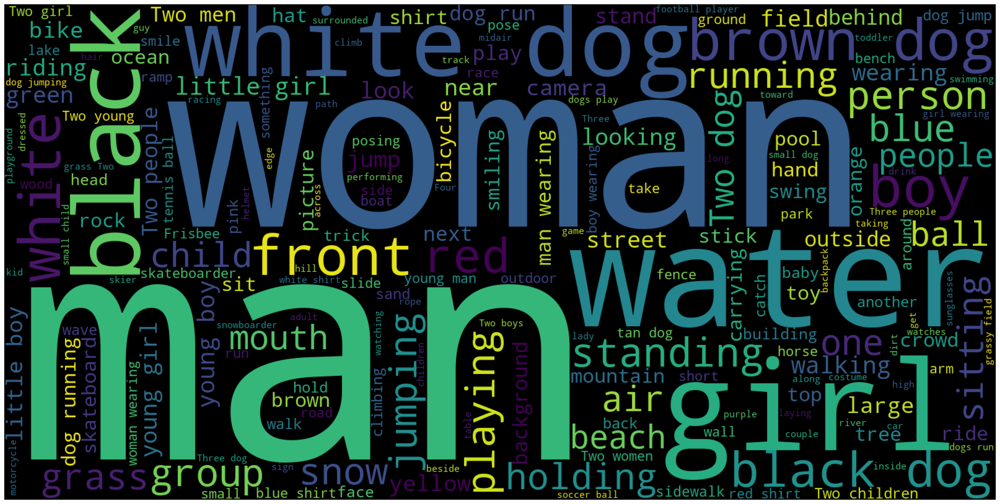

In [12]:
plt.figure(1,figsize=(30,20))
plt.imshow(wordcloud_captions)
plt.axis('off')
plt.show();

### Observation:
* If you can observe in the wordcloud displayed has some of the words larger than the other.That is because the size of the word in the word cloud is directly proportional to the frequency of the word inside the corpus.

In [13]:
# Grouping every Image as key with their captions as values!
Img_group =captions.groupby(captions['image'])
Img_group.groups # Dict having keys and values

{'1000268201_693b08cb0e.jpg': [0, 1, 2, 3, 4], '1001773457_577c3a7d70.jpg': [5, 6, 7, 8, 9], '1002674143_1b742ab4b8.jpg': [10, 11, 12, 13, 14], '1003163366_44323f5815.jpg': [15, 16, 17, 18, 19], '1007129816_e794419615.jpg': [20, 21, 22, 23, 24], '1007320043_627395c3d8.jpg': [25, 26, 27, 28, 29], '1009434119_febe49276a.jpg': [30, 31, 32, 33, 34], '1012212859_01547e3f17.jpg': [35, 36, 37, 38, 39], '1015118661_980735411b.jpg': [40, 41, 42, 43, 44], '1015584366_dfcec3c85a.jpg': [45, 46, 47, 48, 49], '101654506_8eb26cfb60.jpg': [50, 51, 52, 53, 54], '101669240_b2d3e7f17b.jpg': [55, 56, 57, 58, 59], '1016887272_03199f49c4.jpg': [60, 61, 62, 63, 64], '1019077836_6fc9b15408.jpg': [65, 66, 67, 68, 69], '1019604187_d087bf9a5f.jpg': [70, 71, 72, 73, 74], '1020651753_06077ec457.jpg': [75, 76, 77, 78, 79], '1022454332_6af2c1449a.jpg': [80, 81, 82, 83, 84], '1022454428_b6b660a67b.jpg': [85, 86, 87, 88, 89], '1022975728_75515238d8.jpg': [90, 91, 92, 93, 94], '102351840_323e3de834.jpg': [95, 96, 97, 9

In [14]:
Img_group.get_group('109738763_90541ef30d.jpg')

,image,caption
445,109738763_90541ef30d.jpg,A person on a snowmobile in mid jump .
446,109738763_90541ef30d.jpg,A snowmobiler flies through the air .
447,109738763_90541ef30d.jpg,A snowmobile rider flies through the air on hi...
448,109738763_90541ef30d.jpg,Rider jumps snowmobile high in rural area .
449,109738763_90541ef30d.jpg,The man is up in the air .


In [15]:
Img_group.get_group('109738763_90541ef30d.jpg')['caption']

445               A person on a snowmobile in mid jump .
446                A snowmobiler flies through the air .
447    A snowmobile rider flies through the air on hi...
448          Rider jumps snowmobile high in rural area .
449                           The man is up in the air .
Name: caption, dtype: object

In [16]:
Img_group.groups.keys()

dict_keys(['1000268201_693b08cb0e.jpg', '1001773457_577c3a7d70.jpg', '1002674143_1b742ab4b8.jpg', '1003163366_44323f5815.jpg', '1007129816_e794419615.jpg', '1007320043_627395c3d8.jpg', '1009434119_febe49276a.jpg', '1012212859_01547e3f17.jpg', '1015118661_980735411b.jpg', '1015584366_dfcec3c85a.jpg', '101654506_8eb26cfb60.jpg', '101669240_b2d3e7f17b.jpg', '1016887272_03199f49c4.jpg', '1019077836_6fc9b15408.jpg', '1019604187_d087bf9a5f.jpg', '1020651753_06077ec457.jpg', '1022454332_6af2c1449a.jpg', '1022454428_b6b660a67b.jpg', '1022975728_75515238d8.jpg', '102351840_323e3de834.jpg', '1024138940_f1fefbdce1.jpg', '102455176_5f8ead62d5.jpg', '1026685415_0431cbf574.jpg', '1028205764_7e8df9a2ea.jpg', '1030985833_b0902ea560.jpg', '103106960_e8a41d64f8.jpg', '103195344_5d2dc613a3.jpg', '103205630_682ca7285b.jpg', '1032122270_ea6f0beedb.jpg', '1032460886_4a598ed535.jpg', '1034276567_49bb87c51c.jpg', '104136873_5b5d41be75.jpg', '1042020065_fb3d3ba5ba.jpg', '1042590306_95dea0916c.jpg', '1045521051

In [17]:
len(Img_group.groups.keys())

8091

> We can use the keys from the group to read images easily.

## How Image and caption together Look?

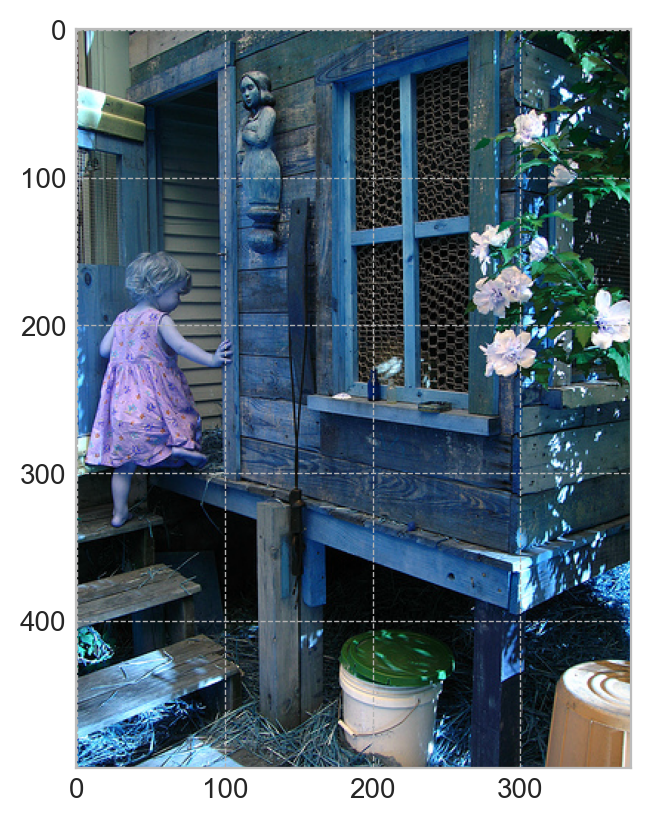

0    A child in a pink dress is climbing up a set o...
1                A girl going into a wooden building .
2     A little girl climbing into a wooden playhouse .
3    A little girl climbing the stairs to her playh...
4    A little girl in a pink dress going into a woo...
Name: caption, dtype: object


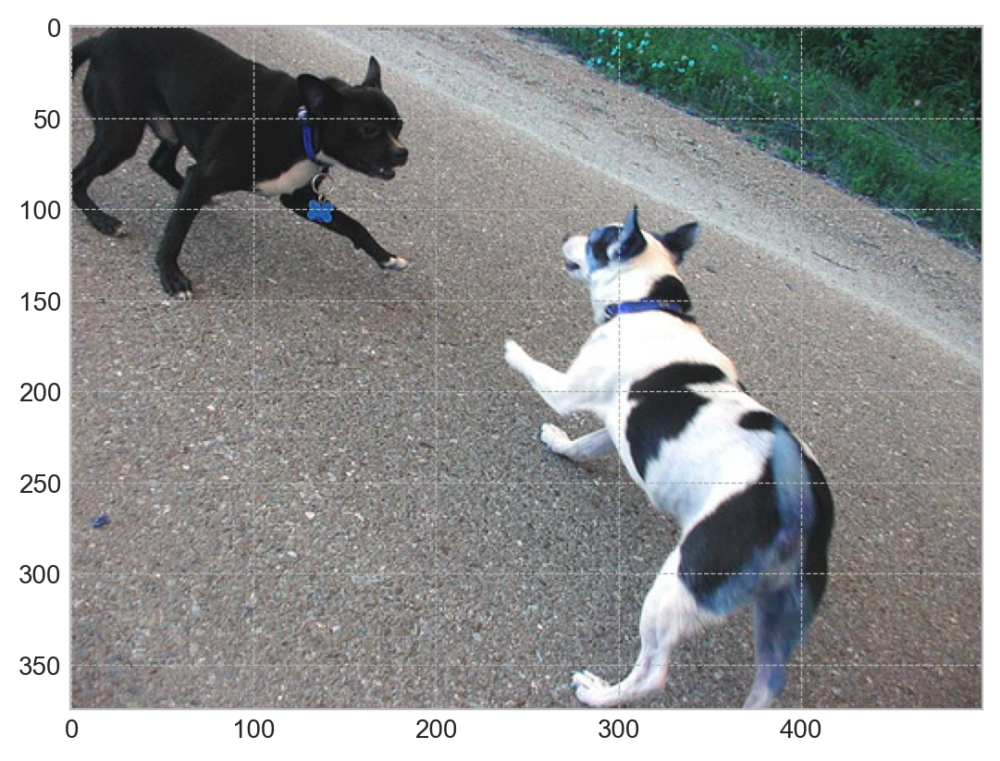

5           A black dog and a spotted dog are fighting
6    A black dog and a tri-colored dog playing with...
7    A black dog and a white dog with brown spots a...
8    Two dogs of different breeds looking at each o...
9      Two dogs on pavement moving toward each other .
Name: caption, dtype: object


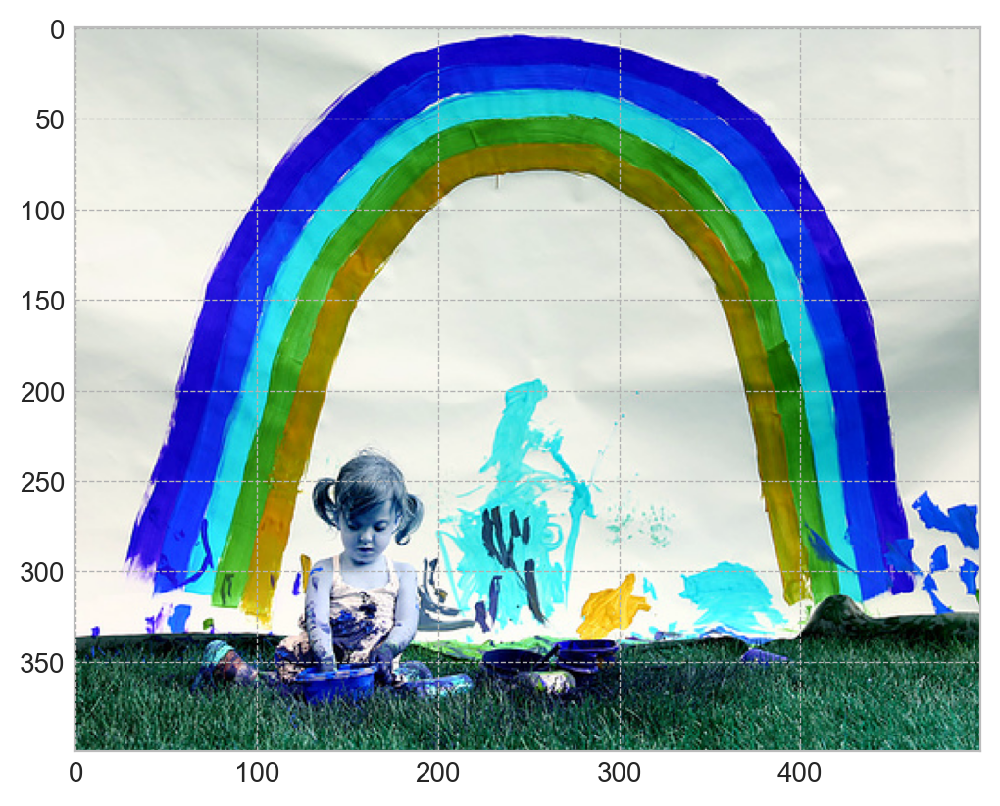

10    A little girl covered in paint sits in front o...
11    A little girl is sitting in front of a large p...
12    A small girl in the grass plays with fingerpai...
13    There is a girl with pigtails sitting in front...
14    Young girl with pigtails painting outside in t...
Name: caption, dtype: object


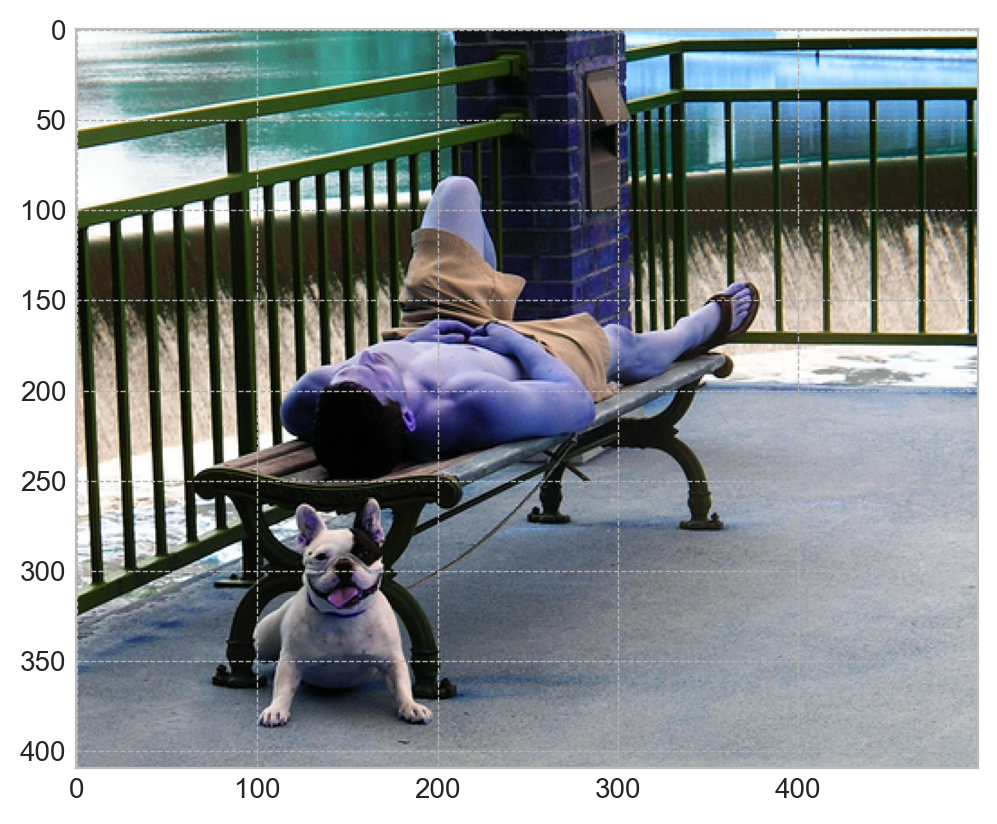

15    A man lays on a bench while his dog sits by him .
16    A man lays on the bench to which a white dog i...
17    a man sleeping on a bench outside with a white...
18    A shirtless man lies on a park bench with his ...
19    man laying on bench holding leash of dog sitti...
Name: caption, dtype: object


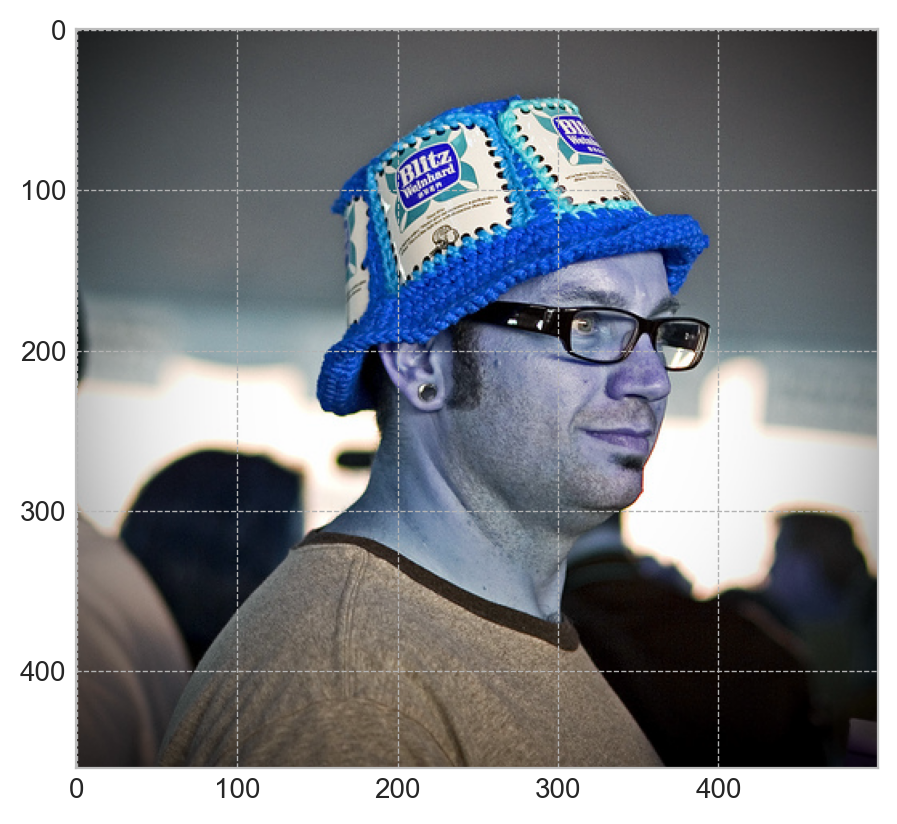

20       A man in an orange hat starring at something .
21              A man wears an orange hat and glasses .
22    A man with gauges and glasses is wearing a Bli...
23    A man with glasses is wearing a beer can croch...
24    The man with pierced ears is wearing glasses a...
Name: caption, dtype: object


In [18]:
count = 0
for i in Img_group.groups.keys():
    img = cv2.imread(r"C:\Users\RAGUWING\Pictures\Image_captioning\Images\{}".format(i))
    plt.imshow(img)
    plt.show();
    print(Img_group.get_group(i)['caption'])
    count+=1
    
    if count ==5:
        break

# 3 Text Preprocessing
> Not to do

   - Pos tagging 
   - Stemming and lemmatization (running & runner --> run) # It's drawback
   - Don't Remove Stopwords
   - Don't Remove any spaces
   
> To Do
   - lower case
   - Remove Special characters
   - Remove words which are having len(word)<1 such as `a`, `i` etc.

In [19]:
# Lets copy the data to new variable for safety

In [20]:
caption_df = captions.copy()
caption_df

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .


In [21]:
# using the `applymap` function of pandas to perform quick preprocessing
print('Lower case conversion')
caption_df['caption'] = caption_df[['caption']].applymap(lambda x : x.lower())
caption_df.head()

print('Remove special characters, symbols etc')
caption_df['caption'] = caption_df[['caption']].applymap(lambda x : re.sub('[^a-z ]','',x))
caption_df.head()


Lower case conversion


,image,caption
0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,a girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...


Remove special characters, symbols etc


,image,caption
0,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,a girl going into a wooden building
2,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse
3,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...


In [22]:
# Function for removing less than 1 length

def remaining(caption):
    caption_words = caption.split()
    remain_words = []
    for word in caption_words:
        if len(word)>1:
            remain_words.append(word)
    new_words = ' '.join(remain_words)
    
    return new_words

In [23]:
caption_df['caption'] = caption_df[['caption']].applymap(remaining)
caption_df.head()

,image,caption
0,1000268201_693b08cb0e.jpg,child in pink dress is climbing up set of stai...
1,1000268201_693b08cb0e.jpg,girl going into wooden building
2,1000268201_693b08cb0e.jpg,little girl climbing into wooden playhouse
3,1000268201_693b08cb0e.jpg,little girl climbing the stairs to her playhouse
4,1000268201_693b08cb0e.jpg,little girl in pink dress going into wooden cabin


# Image Pre-Processing

# One to Many

- Sentences should have previous words to predict next words.

> Issue : given image to generate text it has to know start and ending word to stop the sequence .In order to caculate the conditional probability it will be calculated accurately with correct distribution
    
> Sol: We will add a word at start (like start_sequence) and Ending (like ending_sequence)

In [24]:
caption_df['caption'] = caption_df[['caption']].applymap(lambda x : 'clf '+ x + ' elf')
caption_df.head()

# Any word we can add but it should not present in the corpus

,image,caption
0,1000268201_693b08cb0e.jpg,clf child in pink dress is climbing up set of ...
1,1000268201_693b08cb0e.jpg,clf girl going into wooden building elf
2,1000268201_693b08cb0e.jpg,clf little girl climbing into wooden playhouse...
3,1000268201_693b08cb0e.jpg,clf little girl climbing the stairs to her pla...
4,1000268201_693b08cb0e.jpg,clf little girl in pink dress going into woode...


## CNN - For Image Feature Extraction 

> We will use transfer learning technique (pre-trained model `ResNet50`)

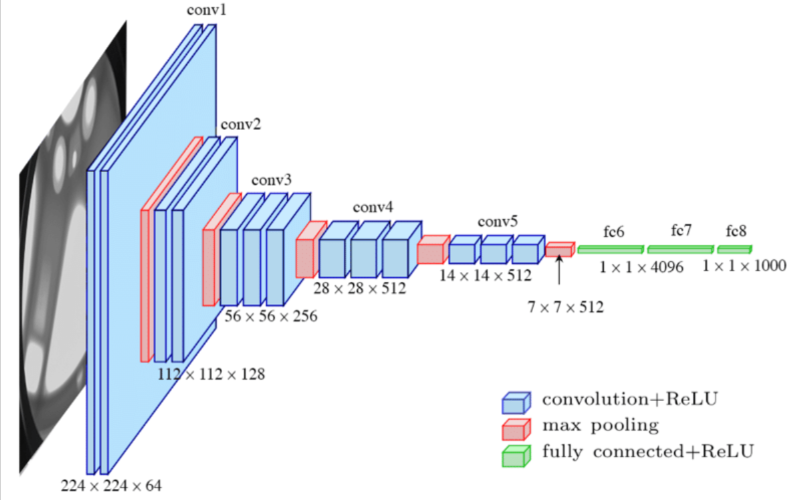

In [25]:
# install keras library
#!pip install keras

In [26]:
import keras
from keras.applications import ResNet50
from keras.models import Sequential

In [27]:
from keras import Model

## Model Loading (Transfer Learning) For CNN

In [28]:
pre_ResNet50 = ResNet50(weights='imagenet',input_shape= (224,224,3)) # trained weights from image net

In [29]:
pre_ResNet50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [30]:
pre_ResNet50.layers # It is a list we will use indexing

## Observations:
* Total params: `25636712 (97.80 MB)`
* Trainable params: `25583592 (97.59 MB)`
* Non-trainable params: `53120 (207.50 KB)

> Remove the `predictions (Dense)` Layers because we only want to extract image features, which we can get from final FeatureMap `avg_pool` (GlobalAveragePooling2D) layer

In [31]:
resnet50 = Model(pre_ResNet50.input,pre_ResNet50.layers[-2].output)
resnet50.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

## Observations:
**You can observe the decrease in parameters(weights) due to decrease in dense layers**
* Total params: `23587712 (89.98 MB)`
* Trainable params: `23534592 (89.78 MB)`
* Non-trainable params: `53120 (207.50 KB)`

### Using the model for Image Feature Extraction

In [32]:
#final_images = {}
#for i in caption_df['image'].unique():
#    img = cv2.imread(r"C:\Users\RAGUWING\Pictures\Image_captioning\Images\{}".format(i))
#    img = cv2.resize(img,(224,224))
#    img = img/255.0                                         # -->  Normalization
#    img = img.reshape(1,224,224,3)
#    output_img = resnet50.predict(img)
#    final = output_img.reshape(-1)
#    final_images.update({i:final})

In [33]:
#len(final_images)

In [34]:
# Lets save the image feature extractions at a place for later use

In [35]:
#with open(r"C:\Users\RAGUWING\Pictures\Image_captioning\feature.pkl","wb") as t:
    #pickle.dump(final_images,t)

In [36]:
final_pickle = open(r"C:\Users\RAGUWING\Pictures\Image_captioning\feature.pkl",'rb')
model_pickle = pickle.load(final_pickle)

In [37]:
len(model_pickle)

8091

In [38]:
model_pickle

{'1000268201_693b08cb0e.jpg': array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 '1001773457_577c3a7d70.jpg': array([0.0000000e+00, 0.0000000e+00, 3.4901561e-04, ..., 2.0024707e+00,
        0.0000000e+00, 0.0000000e+00], dtype=float32),
 '1002674143_1b742ab4b8.jpg': array([0.        , 0.        , 0.01130231, ..., 2.7378428 , 0.        ,
        0.        ], dtype=float32),
 '1003163366_44323f5815.jpg': array([0.       , 0.       , 0.       , ..., 2.2767828, 0.       ,
        0.       ], dtype=float32),
 '1007129816_e794419615.jpg': array([0.       , 0.       , 0.       , ..., 2.0650728, 0.       ,
        0.       ], dtype=float32),
 '1007320043_627395c3d8.jpg': array([0.        , 0.        , 0.03130256, ..., 2.4663873 , 0.        ,
        0.        ], dtype=float32),
 '1009434119_febe49276a.jpg': array([0.        , 0.        , 0.00298841, ..., 2.2807736 , 0.        ,
        0.        ], dtype=float32),
 '1012212859_01547e3f

# Preparing the final DataSet 
`text vector, image vector and final labels`

> When dealing with Text data 

    - we have to identify vocabulary size
        - unique words
    - Highest & lowest length of word
        - Padding

In [39]:
# Let's find out total unique words
unique_words = set()
for i in caption_df['caption'].values:
    unique_words.update(i.split())

In [40]:
len(unique_words)

8766

In [41]:
# Let's find the highest length document and least
print('caption with max size(highest length): ',caption_df[['caption']].applymap(lambda x: len(x.split())).max())

caption with max size(highest length):  caption    34
dtype: int64


In [42]:
print('caption with min size(least length): ',caption_df[['caption']].applymap(lambda x: len(x.split())).min())

caption with min size(least length):  caption    2
dtype: int64


## Observation:
* As we are dealing with in-consistent length of documents, we must use `padding` to make all the documents same size. In general padding will be of `ZERO`.

In [43]:
## We will be needing a word_index in order to perform the padding
word_index = {}
for key,word in enumerate(unique_words,start = 1): # In padding it will give Zero so we have to start from 1
    word_index.update({word:key})

In [44]:
from keras.utils import pad_sequences
from keras.utils import to_categorical

In [45]:
## Lets take split our data into train and test

In [46]:
Img_Train = []
Text_Train = []
Label_Train = []

for index in range(0,1000):
    sentence = caption_df[['caption']].iloc[index].values[0].split()
    for word in range(1, len(sentence)):
        Img_Train.append(model_pickle[caption_df[['image']].iloc[index].values[0]])
        
        feature1 = sentence[0:word]
        feature2 = sentence[word]
        
        word_ = []
        
        for i in feature1:
            word_.append(word_index[i])
        
        Text_Train.append(pad_sequences([word_],maxlen=34,padding = 'post')[0]) # Integer Encoding along with padding.
        label = word_index[feature2]
        Label_Train.append(to_categorical([label],num_classes=8767)[0])



In [47]:
Img_Train

[array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.00673384, ..., 2.673341  , 0.        ,
        0.        ], dtype=float32),
 array([0.

In [48]:
Text_Train

[array([1807,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]),
 array([1807, 8352,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]),
 array([1807, 8352, 2808,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]),
 array([1807, 8352, 2808, 2080,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]),
 array([1807, 8352, 2808, 2080, 6493,    0,    0

In [49]:
Label_Train

[array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0.,

In [51]:
Img_Test = []
Text_Test = []
Label_Test = []

for index in range(1000,1501):
    sentence = caption_df[['caption']].iloc[index].values[0].split()
    for word in range(1, len(sentence)):
        Img_Test.append(model_pickle[caption_df[['image']].iloc[index].values[0]])
        
        feature1 = sentence[0:word]
        feature2 = sentence[word]
        
        word_ = []
        
        for i in feature1:
            word_.append(word_index[i])
        
        Text_Test.append(pad_sequences([word_],maxlen=34,padding = 'post')[0]) # Integer Encoding along with padding.
        label = word_index[feature2]
        Label_Test.append(to_categorical([label],num_classes=8767)[0])

In [52]:
Img_Test

[array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.      , ..., 1.868573, 0.      , 0.      ],
       dtype=float32),
 array([0.      , 0.      , 0.

In [53]:
Text_Test

[array([1807,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]),
 array([1807, 6884,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]),
 array([1807, 6884,  785,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]),
 array([1807, 6884,  785, 6578,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]),
 array([1807, 6884,  785, 6578, 4672,    0,    0

In [54]:
Label_Test

[array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., ..., 0.,

In [55]:
Img_Train[0].shape

(2048,)

## Model Building

In [56]:
from keras.layers import Dense,Embedding,LSTM,add,Input
from keras import Model

### Text

In [57]:
input_Text = Input(shape=(34,)) # max_vocab_size

output_Text = Embedding(input_dim=8766+1,output_dim=40)(input_Text) # length vocab_size

Text_output = LSTM(256)(output_Text)

### Image

In [58]:
input_Image  = Input(shape=(2048,))
Image_output = Dense(256,activation="relu")(input_Image)

In [59]:
Add_models = add([Image_output,Text_output])
Final_output = Dense(8767,activation="softmax")(Add_models)

In [60]:
model = Model(inputs = [input_Image,input_Text],outputs=[Final_output])

In [61]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 34)]                 0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 34, 40)               350680    ['input_2[0][0]']             
                                                                                                  
 dense (Dense)               (None, 256)                  524544    ['input_3[0][0]']             
                                                                                            

In [74]:
from keras.callbacks import EarlyStopping
call = EarlyStopping(monitor='val_loss',
    min_delta=0.5,
    patience=5,
    verbose=1,
    mode='auto')

In [75]:
model.compile(loss="categorical_crossentropy",optimizer="adam",metrics='accuracy')

In [76]:
model.fit([np.array(Img_Train),np.array(Text_Train)],np.array(Label_Train), epochs=5)

Epoch 1/5
323/323 [==============================] - 24s 68ms/step - loss: 5.5264 - accuracy: 0.0967
Epoch 2/5
323/323 [==============================] - 23s 72ms/step - loss: 5.4191 - accuracy: 0.0969
Epoch 3/5
323/323 [==============================] - 24s 73ms/step - loss: 5.3763 - accuracy: 0.0969
Epoch 4/5
323/323 [==============================] - 22s 68ms/step - loss: 5.3464 - accuracy: 0.0969
Epoch 5/5
323/323 [==============================] - 21s 67ms/step - loss: 5.3171 - accuracy: 0.0969


## Prediction

In [77]:
y_cap = model.predict([np.array(Img_Test),np.array(Text_Test)])

170/170 [==============================] - 3s 13ms/step


## How to Evaluate is yet to perform
**I am Open to suggestions**